# An exploration of firstcal on HERA golden data set

In this notebook we explore the the first cal solutions (as a function of integration) on the golden set of HERA observations. This set corresponds to a JD of 2457458. The data can be found on folio at /data4/paper/HERA2015/2457458/\* or via the librarian interface. Instructions for the librarian on folio can be found at http://herawiki.berkeley.edu/doku.php/librarian?s[]=librarian. 

In [1]:
import numpy as np, capo.omni as omni, sys, optparse, glob, capo, aipy as a, pandas as pd
%matplotlib inline
import matplotlib.pyplot as p
import seaborn as sns
sns.set_context('poster')
sns.set_style('darkgrid') 
p.rcParams['figure.figsize'] = 12, 8
#import mpld3
#mpld3.enable_notebook()

colors = ["#006BA4", "#FF7F0E", "#2CA02C", "#D61D28", "#9467BD", "#8C564B", "#E377C2", "#7F7F7F", "#BCBD22", "#17BECF"]
symbols = ["o", "v", "^", "<", ">", "*"]

/usr/local/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


# Firstcal delay solutions

In [43]:
def load_dmv(filestring, offsets=False):
    files = glob.glob('/Users/sherlock/projects/hera/data/%s'%filestring)
    delays = {}
    means = {}
    medians = {}
    vars = {}
    if offsets: ss = 'o'
    else: ss = 'd'
    for f in files:
        print 'Reading %s'%f
        npz = np.load(f)
        for key in npz.files:
            if key.startswith(ss):
                if key not in delays.keys(): 
                    delays[key] = npz[key]
                    continue 
                delays[key] = np.hstack((delays[key],npz[key]))
    
    for k in delays.keys():
        delays[k] = np.array(delays[k]).flatten()
        means[k] = np.mean(delays[k])
        medians[k] = np.median(delays[k])
        vars[k] = np.var(delays[k])
        
    return delays,means,medians,vars
    

delays, means, medians, vars = load_dmv('2457458/zen.2457458.[1-6]*.fc.npz',offsets=False)

Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.16694.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.17389.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.18085.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.18781.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.19477.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.20173.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.20869.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.21565.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.22261.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.22957.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.23653.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.24349.xx.uvA.fc.npz
Read

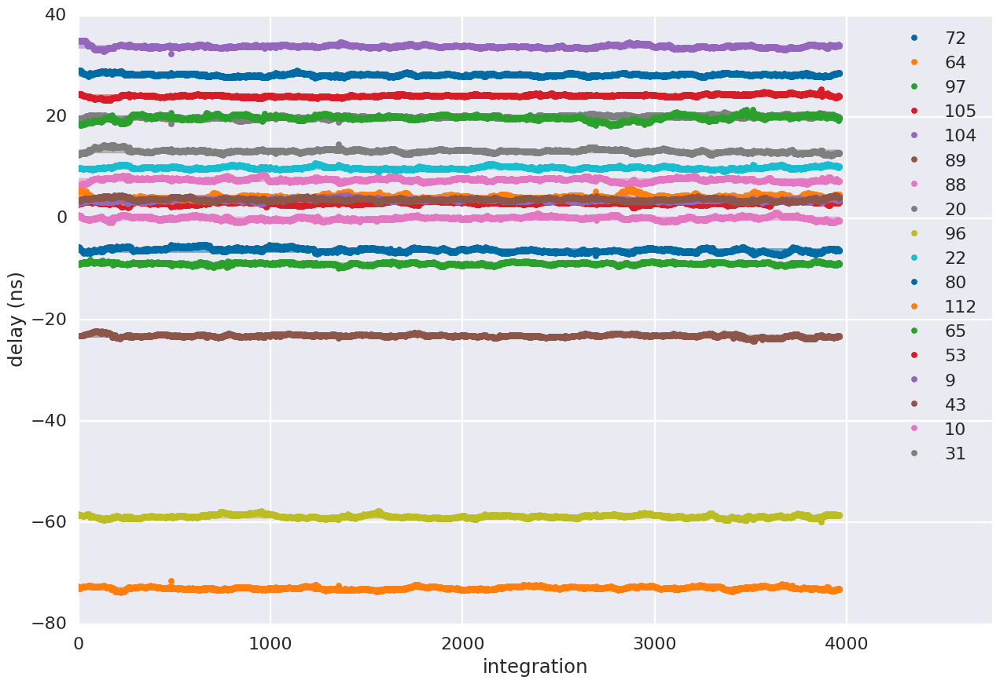

In [44]:
fig = p.figure(figsize=(15,10))
p.subplot(111)

for i,k in enumerate(delays.keys()):
    p.plot(delays[k],'.', color=colors[i%10], label=k[1:])
    p.fill_between(np.arange(delays[k].size), means[k] - vars[k]**.5, means[k] + vars[k]**.5, alpha=.5, color=colors[i%10])
p.xlabel('integration')    
p.ylabel('delay (ns)')
p.xlim(0,delays[k].size + delays[k].size*.2)
p.legend()

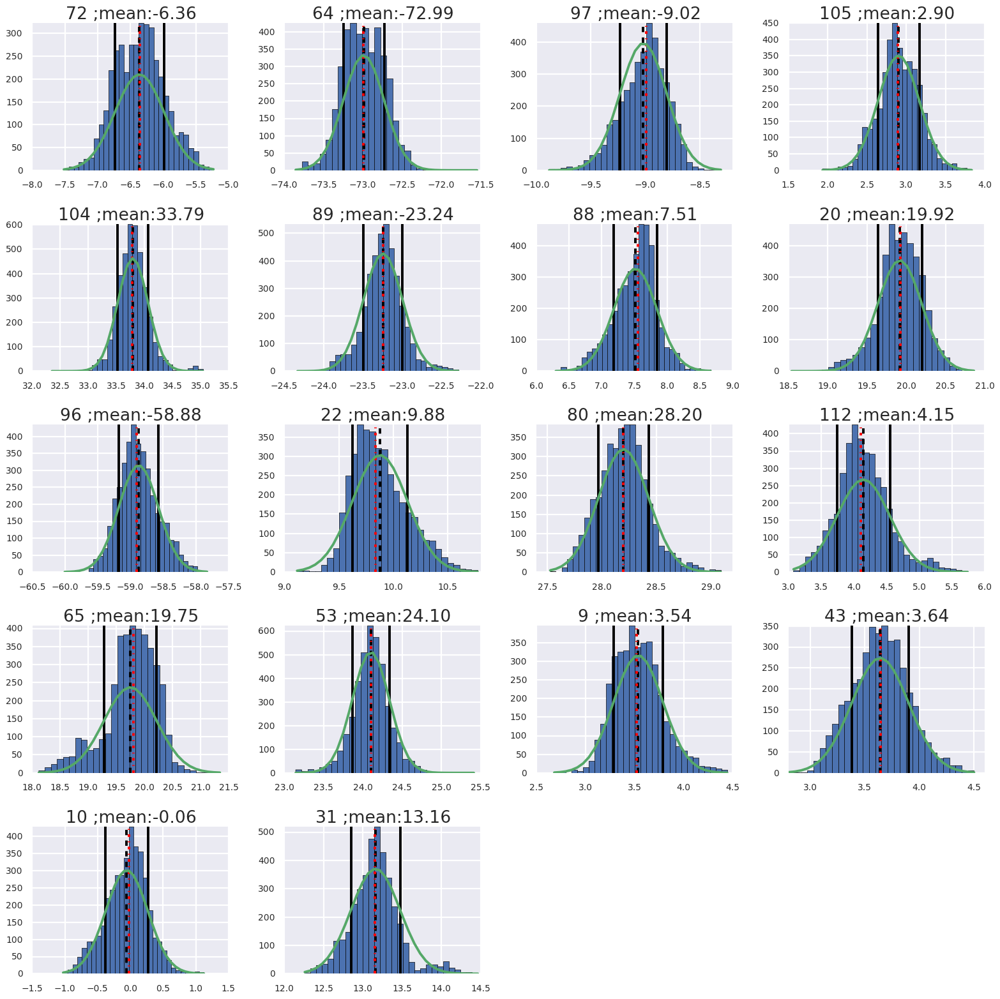

In [45]:
#df = pd.DataFrame(delays)
def gaussian(x,mu,std,scale):
    return scale/np.sqrt(np.pi*2*std) * np.exp(-.5*(x-mu)**2/(std**2))
    
nants = len(delays.keys())
nc = 4
nr = int(divmod(nants,nc)[0] + np.ceil(divmod(nants,nc)[1]/float(nc)))
p.figure(figsize=(16,16))
for i,k in enumerate(delays.keys()):
    p.subplot(nr,nc,i+1)
    h = p.hist(delays[k], bins=30)
    p.tick_params(labelsize=10)
    p.title(k[1:] + ' ;mean:%1.2f'%means[k])
    p.grid(1)
    mx = np.max(h[0])
    p.plot(h[1],gaussian(h[1],means[k],vars[k]**.5,scale=mx))
    p.vlines(means[k], 0, mx, linestyle='--')
    p.vlines(medians[k],0,mx, linestyle='-.', color='red')
    p.vlines(means[k]-np.sqrt(vars[k]),0,mx)
    p.vlines(means[k]+np.sqrt(vars[k]),0,mx)
    p.ylim(0,mx)
p.tight_layout(pad=1.0)
#p.subplots_adjust(wspace=.5,hspace=.6)
    

Above are the delay solutions as a function of integration for a night of data. Plotted in dots are the delay solution/integeration and plotted under them are the mean 1-standard dev errors.  Basically all of the antennas are fairly stable as a function of time. Things check out on that front.

Additionally, the histograms for the delay solutions for each antenna are also shown directly above. Overplotted are the mean value (dashed line), median value (red dashed line), mean $\pm$ 1-standard deviation(solid lines) and a gaussian curve with the same mean and standard deviation as the the delay solutions. The amplitude is given by the maximum value of the histogram.   These histograms show tight delay solutions. However, there are outliers and the solutions are not completely described by a gaussian. That is, this variation is not due to thermal (random) noise. What could be causing the outliers?

There are some distributions that look almost multimodal. e.g. antenna 31. What causes this multimodal distribution? Is it time dependent? etc..



What happens when we apply the solutions to the visibilities? Are we redundant? Why or why not? How far off are we?

##Offsets


In [48]:
offsets, omeans, omedians, ovars = load_dmv('2457458/zen.2457458.[1-6]*.fc.npz',offsets=True)

Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.16694.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.17389.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.18085.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.18781.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.19477.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.20173.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.20869.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.21565.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.22261.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.22957.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.23653.xx.uvA.fc.npz
Reading /Users/sherlock/projects/hera/data/2457458/zen.2457458.24349.xx.uvA.fc.npz
Read

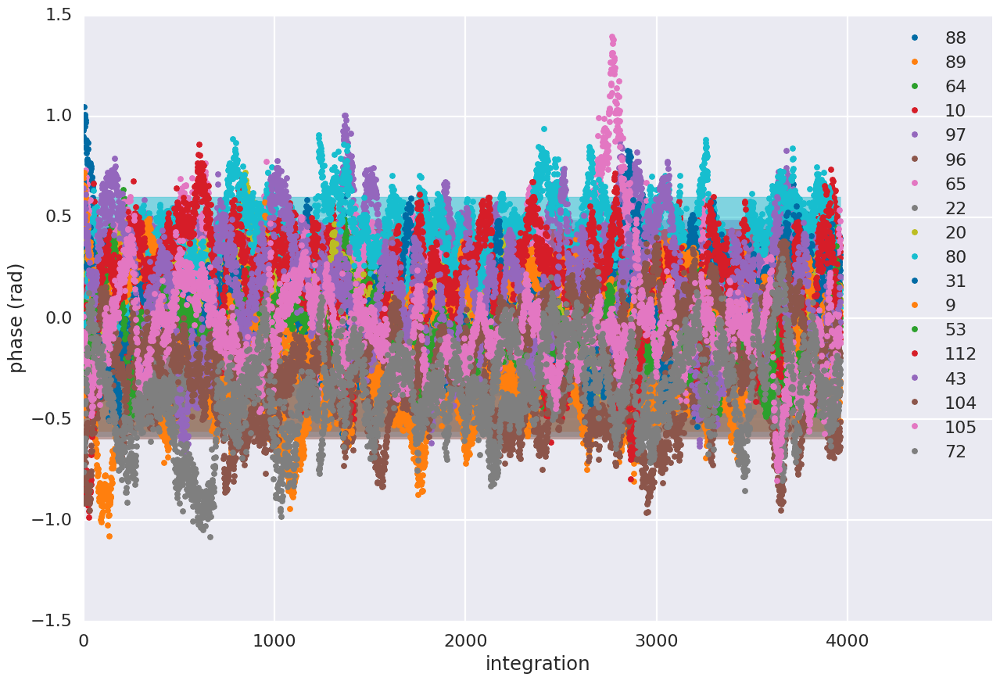

In [49]:
fig = p.figure(figsize=(15,10))
p.subplot(111)

for i,k in enumerate(offsets.keys()):
    p.plot(offsets[k],'.', color=colors[i%10], label=k[1:])
    p.fill_between(np.arange(offsets[k].size), omeans[k] - ovars[k]**.5, omeans[k] + ovars[k]**.5, alpha=.5, color=colors[i%10])
p.xlabel('integration')    
p.ylabel('phase (rad)')
p.xlim(0,offsets[k].size + offsets[k].size*.2)
p.legend()

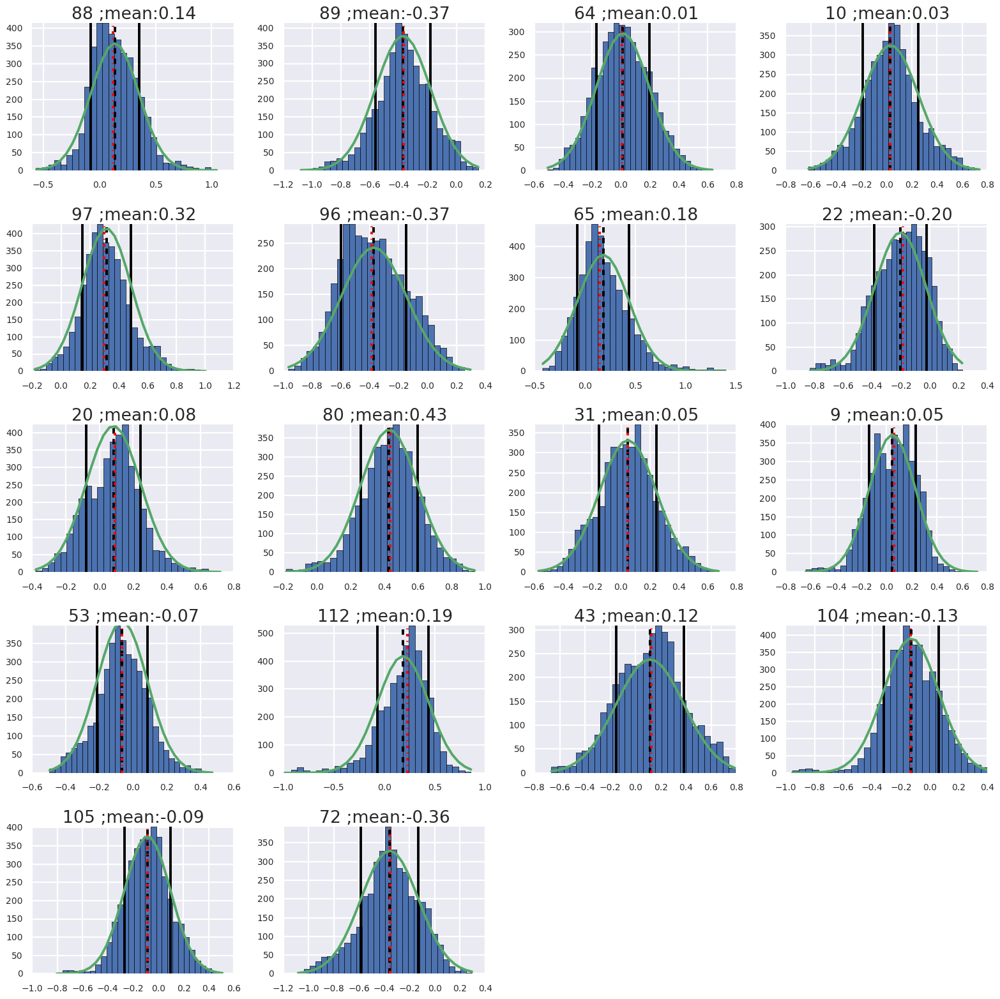

In [50]:
#df = pd.DataFrame(delays)
def gaussian(x,mu,std,scale):
    return scale/np.sqrt(np.pi*2*std) * np.exp(-.5*(x-mu)**2/(std**2))
    
nants = len(offsets.keys())
nc = 4
nr = int(divmod(nants,nc)[0] + np.ceil(divmod(nants,nc)[1]/float(nc)))
p.figure(figsize=(16,16))
for i,k in enumerate(offsets.keys()):
    p.subplot(nr,nc,i+1)
    h = p.hist(offsets[k], bins=30)
    p.tick_params(labelsize=10)
    p.title(k[1:] + ' ;mean:%1.2f'%omeans[k])
    p.grid(1)
    mx = np.max(h[0])
    p.plot(h[1],gaussian(h[1],omeans[k],ovars[k]**.5,scale=mx))
    p.vlines(omeans[k], 0, mx, linestyle='--')
    p.vlines(omedians[k],0,mx, linestyle='-.', color='red')
    p.vlines(omeans[k]-np.sqrt(ovars[k]),0,mx)
    p.vlines(omeans[k]+np.sqrt(ovars[k]),0,mx)
    p.ylim(0,mx)
p.tight_layout(pad=1.0)
#p.subplots_adjust(wspace=.5,hspace=.6)

# Rewriting solutions

We could apply the solutions on a time by time basis, but since the solutions are pretty stable versus time with only a ~nanosecond variation over the whole day on each antenna, it is reasonable to just take the mean or the median. As seen from above, the mean and the median are pretty close for all the antennas and so we opt to use the median soltuion. Using one number for the entire day is going to minimizing introducing time dependent structure into the calibrated visibilities. Lets see how we fare... 

First we need to write out new gain solutions and apply them.



In [53]:
do = {}
for ant in means.keys():
    ant = ant[1:]
    do[int(ant)] = (means['d'+ant],omeans['o'+ant])
fqs = np.linspace(.1,.2,1024)

for f in glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.*.xx.uvA.fc.npz'):
    fname = '.'.join(f.split('.')[:-2] + ['mean'])
    omni.save_gains_fc(do,fqs,'x',fname)
    

Saving fcgains to /Users/sherlock/projects/hera/data/2457458/zen.2457458.16694.xx.uvA.mean.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457458/zen.2457458.17389.xx.uvA.mean.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457458/zen.2457458.18085.xx.uvA.mean.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457458/zen.2457458.18781.xx.uvA.mean.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457458/zen.2457458.19477.xx.uvA.mean.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457458/zen.2457458.20173.xx.uvA.mean.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457458/zen.2457458.20869.xx.uvA.mean.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457458/zen.2457458.21565.xx.uvA.mean.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457458/zen.2457458.22261.xx.uvA.mean.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457458/zen.2457458.22957.xx.uvA.mean.fc.npz
Saving fcgains to /U

In [9]:
#plotting with the actual redundant baselines. 
aa = a.cal.get_aa('hsa7458_v000', np.array([.150]))
info = omni.aa_to_info(aa, fcal=True, ex_ants=[81])
#list of redundant antennas to look at 
antstrs = []
for k in info.get_reds(): antstrs.append(capo.zsa.list2str(k))
#antstrs
#Show the antenna strings for different groups of redundant baselines. This just helps us in getting data out etc. 

Loading FirstCalRedundantInfo class


# Applying Firstcal delays to Visibilites
### Baselines in each redundant group.
    '31_97,53_112,64_72,96_10,80_22',
    '72_80,97_96,112_104',
    '88_97,80_43,64_10',
    '22_112,9_22,31_89,88_105,104_31,80_53,96_65,105_72,64_9,89_10,53_20,65_43',
    '10_88,43_64',
    '31_72,65_112,104_105,96_22',
    '10_20,20_64,22_88,31_80,65_104,43_31,89_53,97_22,112_105',
    '43_104,10_53,97_9,89_80,112_88',
    '9_65,22_43,64_96,88_31,105_89,72_10',
    '65_105,43_72,96_88',
    '10_104,97_53,112_64',
    '43_53,65_80,97_105,10_9,89_64',
    '9_31,20_65,22_89,53_96,64_104,105_20,88_53,112_10',
    '10_105,43_9,65_64,89_88',
    '64_105,9_72,20_112,89_97,80_9,104_20,96_89,65_10,53_22',
    '9_88,22_105,31_53,43_89,53_64,96_104,97_112,20_9,89_20,65_31,112_72,104_80',
    '22_104,112_31,72_53,97_65,105_80',
    '96_112,104_72',
    '9_105,20_22,64_88,65_89,10_97,22_72,96_31,104_53,80_64,53_9,43_10,31_20',
    '53_105,20_72,43_97,80_88,89_112,104_9,96_20,31_22',
    '9_112,20_97,80_20,96_43,88_72,104_89,31_10,64_22',
    '10_80,97_64',
    '10_22,20_88,31_64,89_9,43_20,65_53,97_72,96_80',
    '80_112,104_97',
    '31_105,43_112,96_9,89_72,104_88,65_22',
    '65_72,96_105',
    '43_105,65_88'

In [54]:
antstr = '9_88,22_105,31_53,43_89,53_64,96_104'
#,97_112,20_9,89_20,65_31,112_72,104_80'
#antstr = '97_112,20_9,89_20,65_31,112_72,104_80'
pol='xx'
pmeta, pdata, pflags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.5*.uvA'), antstr, pol)
fmeta, fdata, fflags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.5*.uvAF'), antstr, pol)

Plotted below are the differnet redundant baselines that should already be calibrated to be redundant. As can be seen there is much variation between each other and they don't look very redundant. 


2 3


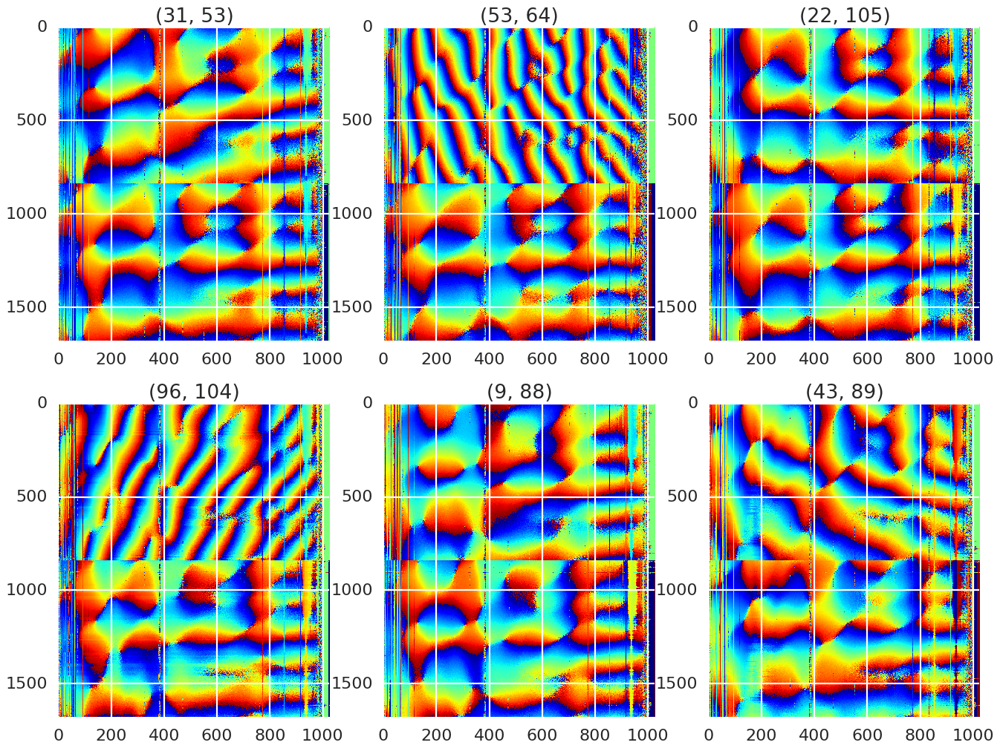

In [55]:
nbls = len(pdata.keys())
r = int(divmod(nbls,3)[0] + np.ceil(divmod(nbls,3)[1]/3.))
c = 3
print r, c
p.figure(figsize=(16,12))
for i,k in enumerate(pdata.keys()):
    p.subplot(r,c,i+1)
    p.title(str(k))
    capo.plot.waterfall(np.vstack((pdata[k][pol],fdata[k][pol])), mode='phs', cmap='jet')

<matplotlib.colorbar.Colorbar instance at 0x10c474d40>

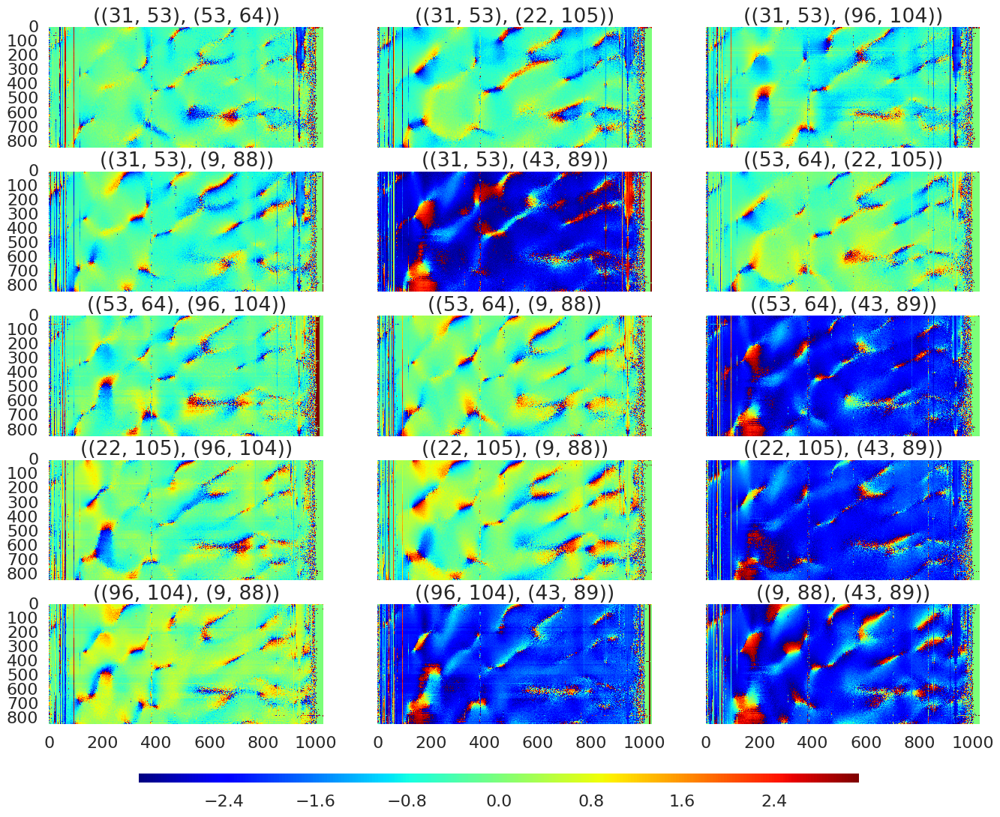

In [56]:
nratios = (nbls * (nbls-1))/2
r = int(divmod(nratios,3)[0] + np.ceil(divmod(nratios,3)[1]/3.))
c = 3
ncross = []
bls = pdata.keys()
for k in range(nbls): 
    for i in range(k+1,nbls): 
        ncross.append((bls[k],bls[i]))

fig = p.figure(figsize=(16,12))
for i,k in enumerate(ncross):
    ax = p.subplot(r,c,i+1)
    p.title(str(k))
    capo.plot.waterfall(fdata[k[0]][pol]*np.conj(fdata[k[-1]][pol]), mode='phs', cmap='jet', mx=np.pi, drng=2*np.pi)
    p.grid(0)
    if divmod(i,c)[-1] != 0:  ax.yaxis.set_visible(False) 
    if divmod(i,c)[0] != r-1: 
        ax.xaxis.set_visible(False)

cax = fig.add_axes([0.2, 0.06, 0.6, 0.01])
p.colorbar(cax=cax, orientation='horizontal')

## Looking at omnical'd data

I went back and omnicalled the files using firstcal solutions as the input and the data look a lot better! The next two plots are the same as above except for omnical'd data. 

Surprising that it worked. The second plot below shows the ratios of redundant baselines, in phase. The phases of the ratios of redundant bls should be zero, and for the most part they are. However, there are parts where the phases diverge. Still thinking about what that means...

In [57]:
meta, data, flags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.5*.uvAO'), antstr, pol)

2 3


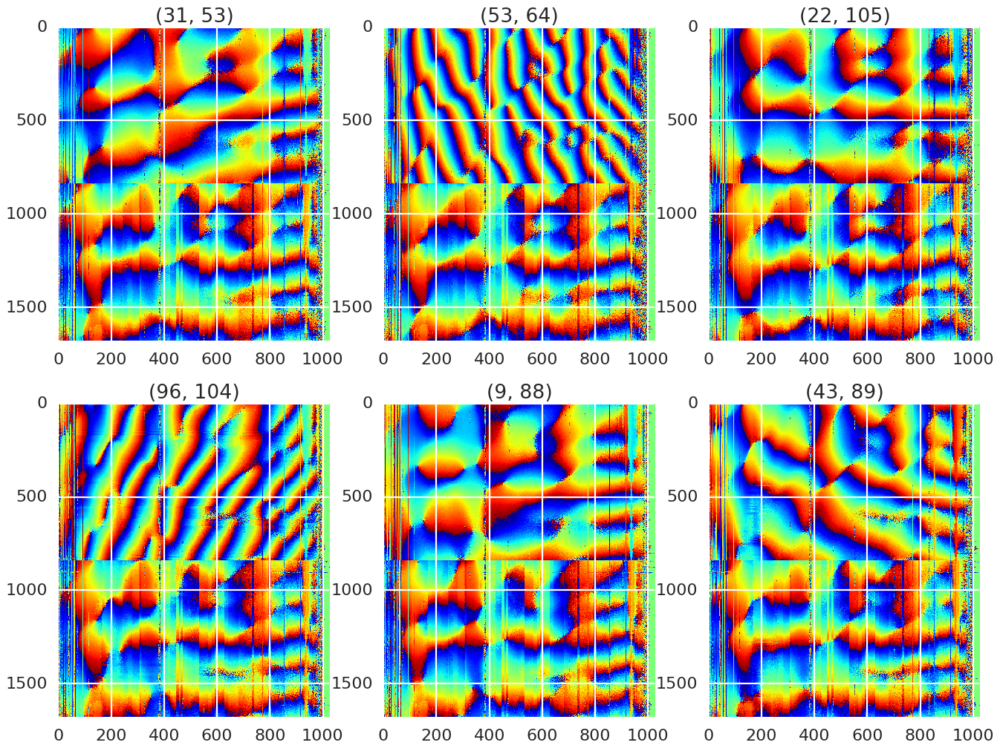

In [58]:
nbls = len(data.keys())
r = int(divmod(nbls,3)[0] + np.ceil(divmod(nbls,3)[1]/3.))
c = 3
print r, c
p.figure(figsize=(16,12))
for i,k in enumerate(data.keys()):
    p.subplot(r,c,i+1)
    p.title(str(k))
    capo.plot.waterfall(np.vstack((pdata[k][pol],data[k][pol])), mode='phs', cmap='jet')

<matplotlib.colorbar.Colorbar instance at 0x1196b19e0>

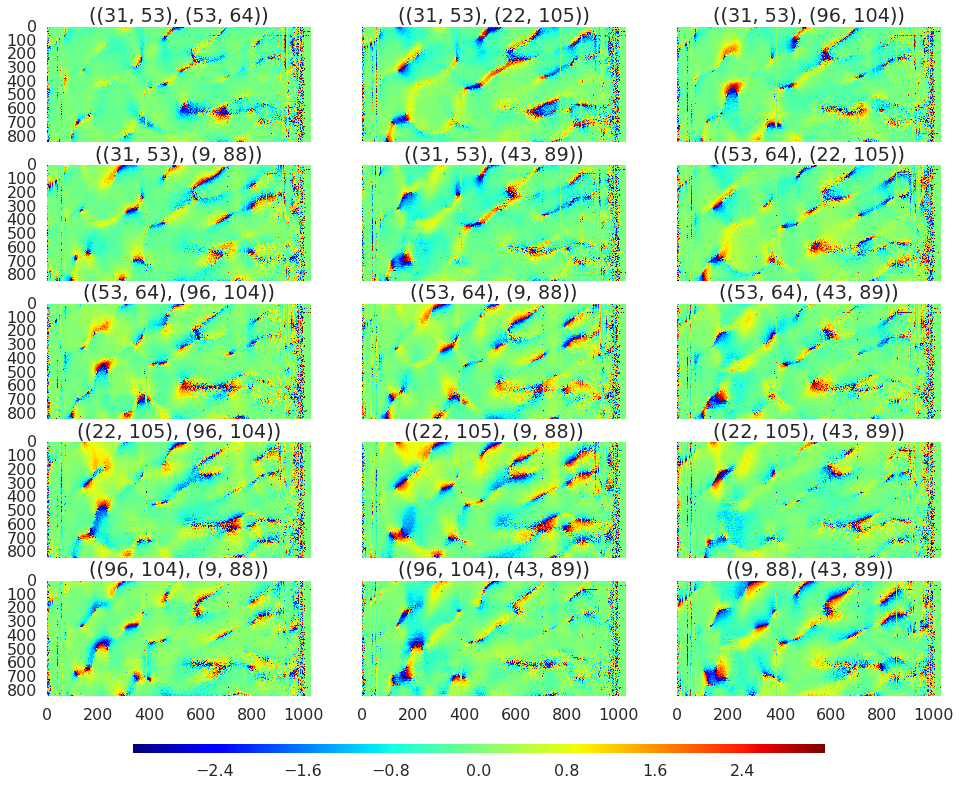

In [22]:
nratios = (nbls * (nbls-1))/2
r = int(divmod(nratios,3)[0] + np.ceil(divmod(nratios,3)[1]/3.))
c = 3
ncross = []
bls = data.keys()
for k in range(nbls): 
    for i in range(k+1,nbls): 
        ncross.append((bls[k],bls[i]))

fig = p.figure(figsize=(16,12))
for i,k in enumerate(ncross):
    ax = p.subplot(r,c,i+1)
    p.title(str(k))
    capo.plot.waterfall(data[k[0]][pol]*np.conj(data[k[-1]][pol]), mode='phs', cmap='jet', mx=np.pi, drng=2*np.pi)
    p.grid(0)
    if divmod(i,c)[-1] != 0:  ax.yaxis.set_visible(False) 
    if divmod(i,c)[0] != r-1: 
        ax.xaxis.set_visible(False)

cax = fig.add_axes([0.2, 0.06, 0.6, 0.01])
p.colorbar(cax=cax, orientation='horizontal')

Since the visibilites are now omnicaled, lets take a look at how well all of the redundant baselines are calibrated to one another. This calls for an omniview plot! Below is some code that creates that and further is some code that loops through the file and makes a gif of the omniview plots. You will need to modify the markdown box to see the gifs (annoying to have them running all the time).


In [23]:
def omni_view(reds, vis, pol, int=10, chan=500, norm=False, save = None):
    points = []
    sym = []
    col = []
    ngps = len(reds)
    if save:
        p.clf()
        p.cla()
    for i,gp in enumerate(reds):
        c = colors[i%len(colors)]
        s = symbols[i/len(colors)]
        for r in gp:
            try:
                points.append(vis[r][pol][int,chan])
            except(KeyError):
                points.append(np.conj(vis[r[::-1]][pol][int,chan]))
            sym.append(s)
            col.append(c)
    points = np.array(points)
    for i,pt in enumerate(points):
        if norm:
             p.scatter(pt.real/np.abs(pt), pt.imag/np.abs(pt), c=col[i], marker=sym[i], s=50)
        else:        
             p.scatter(pt.real, pt.imag, c=col[i], marker=sym[i], s=50)
    p.xlim(-1,1)
    p.ylim(-1,1)
    p.ylabel('imag(V)')
    p.xlabel('real(V)')
    if save:
        p.savefig(save)
    return None

def omni_view_gif(filenames, name='omni_movie.gif'):
    '''Give it a full path for images and all the images you want to use in order to use. list format.'''
    import imageio
    images = []
    for filename in filenames:
        images.append(imageio.imread(filename))
        imageio.mimsave(name, images)
    

In [24]:
antstr = ','.join(antstrs)
#antstr = '9_88,22_105,31_53,43_89,53_64,96_104'#,97_112,20_9,89_20,65_31,112_72,104_80'
pol='xx'
view_meta, view_data, view_flags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.50099.xx.uvA'), antstr, pol)
view_meta_fcal, view_data_fcal, view_flags_ocal = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.50099.xx.uvAF'), antstr, pol)
view_meta_ocal, view_data_ocal, view_flags_ocal = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.50099.xx.uvAO'), antstr, pol)

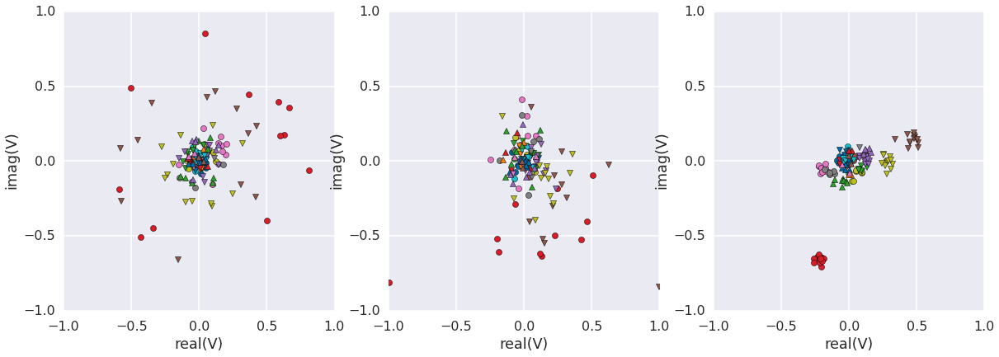

In [25]:
p.figure(1, figsize=(20,6.5))
p.subplot(131)
omni_view(info.get_reds(), view_data, pol, chan=425, norm=False)
p.subplot(132)
omni_view(info.get_reds(), view_data_fcal, pol, chan=425, norm=False)
p.subplot(133)
omni_view(info.get_reds(), view_data_ocal, pol, chan=425, norm=False)

Lets make a omniview gif for the omnicaled visibilites and non omnicaled visibilites.

In [103]:
#This creates gifs for precal and post cal data.
#for t in range(len(view_meta['lsts'])):
#for t in range(5):
#    omni_view(info.get_reds(), view_data, pol, int=t, chan=425, norm=False, save='pngs/omni_view_%d.png'%t)
#    omni_view(info.get_reds(), view_data_ocal, pol, int=t, chan=425, norm=False, save='pngs/omni_view_ocal_%d.png'%t)

In [104]:
#Creates gifs 
#omni_view_gif(glob.glob('pngs/omni_view_[0-9]*.png'), name='pngs/omni_view.gif')
#omni_view_gif(glob.glob('pngs/omni_view_ocal_[0-9]*.png'), name='pngs/omni_view_ocal.gif')

Shown here are the omniview gifs for a single file of pre and post omnical calibration. Before omnical, visibliotes seem to be distributed pretty randomly on the real and complex plane. However, after we firstcal and omnical the data (note that first cal was done per integration) we get visibilities that are far more clustered in the real-imag plane than before. This means that omnical is working! 

Add in brackets to show gifs

img src=pngs/omni_view.gif> <img src=pngs/omni_view_ocal.gif

#Commands 
So now that we have calibrated data, how did we get there? 

These were the commands that were run on the original data to get it into a calibrated state. 
I was using the fc_time branch of capo : https://github.com/zakiali/capo/tree/fc_time commit : 2b00b578ed59abba922fc6733a957af74d956eab. 
Starting with raw data, run firstcal.py in the capo/omni/
1. 
```bash
for f in zen.2457458.{1,2,3,4,5,6}*.xx.uvA; do ~/src/capo/omni/firstcal.py -C hsa7458_v000  ${f} --ex_ants=81 -p xx; done```

Apply firstcal solutions to test and see how they look. These spit out *O files, but are remaned to *F so that we can apply the real omnical solutions later. 
```bash 
~/src/capo/omni/omni_apply.py -p xx --omnipath="%s.uvA.fc.npz" zen.2457458.5*.uvA
```

Then run data through omnical using firstcal solutions as starting point. Note that excluding antenna 81, is forgotten here... This may have been a not so good thing but, it does look like things are redundantly calibrated. This command outputs zen*.xx.npz files which hold the omnical gain solutions for all antennas. 
```bash
for f in zen.2457458.5*.uvA; do  ~/src/capo/omni/omni_run.py -p xx -C hsa7458_v000 --fc2=${f}.fc.npz ${f}; done
```

We then apply the omnical solutions to the RAW data, that is *.uvA files. This makes *.uvAO files and the data are calibrated. 
```bash 
~/src/capo/omni/omni_apply.py -p xx --omnipath="%s.npz" zen.2457458.5*.uvA
```





Let's now go back and add in the --ex_ants=81 for omnical. Hopefully things still look good and the signal to noise in gets better. The phases in the above plots look a little bit noisy at the high frequencies. This may be due to the fact that antenna 81 was cross pol and omnical is trying to calibrate that antenna. 

For this, I have created a direcotry for omnical solutions (omnical_solutions) and the solutions from the above are in the v1 directory. That is omnical solutions are stored in ```omnical_solutions/v1. ```

For completeness, I am rerunning the last two commands from above.

4 3


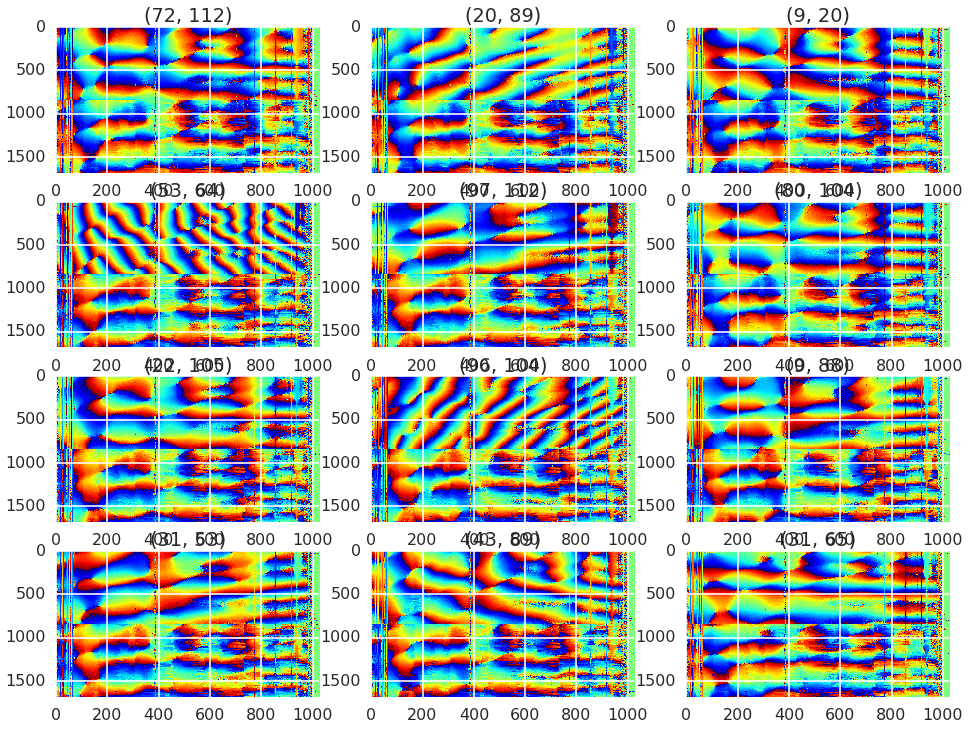

In [26]:
antstr = '9_88,22_105,31_53,43_89,53_64,96_104,97_112,20_9,89_20,65_31,112_72,104_80'
pol='xx'
pmeta, pdata, pflags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.5*.uvA'), antstr, pol)
meta, data, flags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.5*.uvAO'), antstr, pol)

nbls = len(data.keys())
r = int(divmod(nbls,3)[0] + np.ceil(divmod(nbls,3)[1]/3.))
c = 3
print r, c
p.figure(figsize=(16,12))
for i,k in enumerate(data.keys()):
    p.subplot(r,c,i+1)
    p.title(str(k))
    capo.plot.waterfall(np.vstack((pdata[k][pol],data[k][pol])), mode='phs', cmap='jet')

There seems to e no big change. The noisy patch is still there. There may be some degeneracies in the data, but that's ok for now. Redoing the ommniview yields similar results as well.

Note: Antenna 81 did not have a gain solution in the firstcal files. Maybe this get's propogated up the chain to log and lin cal? I don't know what the default is if an antenna does not have initial silutions but the others do. Something to look up later on maybe? 

#Degeneracies? 

Here's a look at the omnical solutions and if there are any degeneracies. Specifically we want to see if our solutions are smooth as a function of frequency. 

Let's load in some omnical solutions

In [27]:
m,g,v,x = omni.from_npz(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.5*.xx.npz'))

/usr/local/lib/python2.7/site-packages/capo/omni.py:257: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if xtalk[pol].get(bl) == None: #no bl key yet


Here are the chisquares:

5 4


<matplotlib.colorbar.Colorbar instance at 0x15a5296c8>

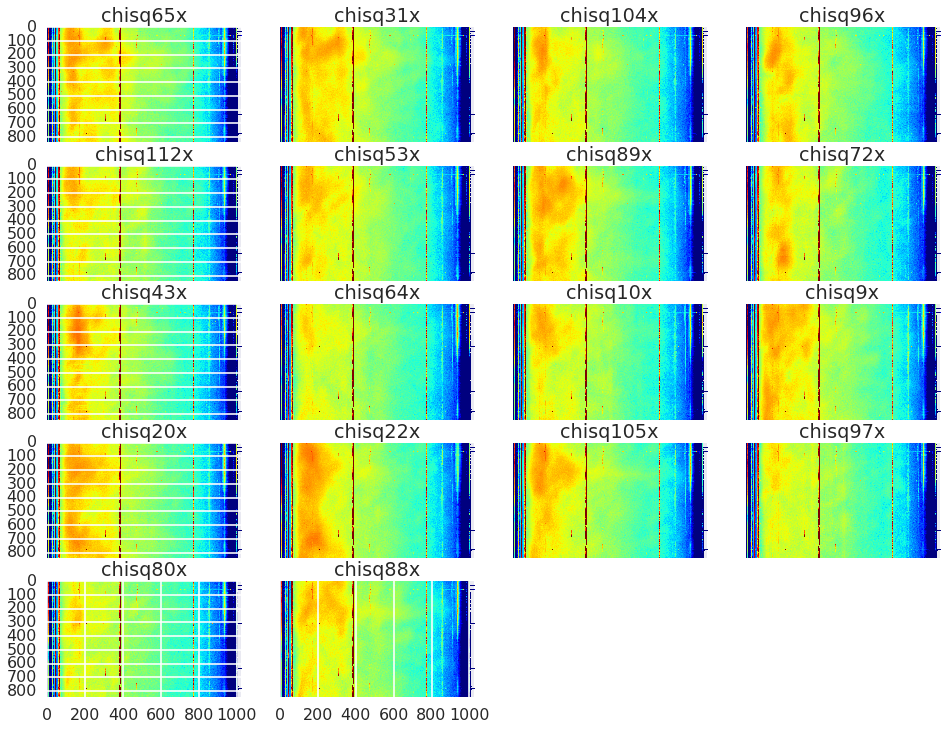

In [68]:
nants = 18
r = 5
c = 4
print r, c
p.figure(figsize=(16,12))

i = 0
for k in m.keys():
    if k.startswith('c') and k.endswith('x'):
        ax = p.subplot(r,c,i+1)
        p.title(k)
        capo.plot.waterfall(m[k], mx =1, drng = 6, cmap='jet')
        if divmod(i,c)[-1] != 0:  ax.yaxis.set_visible(False) 
        if divmod(i,c)[0] != r-1: ax.xaxis.set_visible(False)
        i+=1
        
cax = fig.add_axes([0.2, 0.06, 0.6, 0.01])
p.colorbar(cax=cax, orientation='horizontal')

In [85]:
bls = []
for k in info.get_reds():
    bls+=k
bls = np.array(bls)
plot_these = bls[np.random.randint(0,len(bls),5)]

In [113]:
redmapping = {}
for k in v['xx'].keys():
    for gp in info.get_reds():
        if k in gp:
            for kk in gp : redmapping[kk] = k

In [135]:
s = ''
for k in plot_these:
    s += str(k[0])+'_'+str(k[1])+','
s = s[:-1]

meta, data, flags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.5*.uvAO'), s, pol)

In [138]:
plot_these,data.keys()

(array([[ 96,  10],
        [ 97,  96],
        [ 20,  72],
        [ 96,  89],
        [ 10, 104]]), [(96, 97), (10, 104), (89, 96), (20, 72), (10, 96)])

96 10
97 96
20 72
96 89
10 104


<matplotlib.colorbar.Colorbar instance at 0x213aa3290>

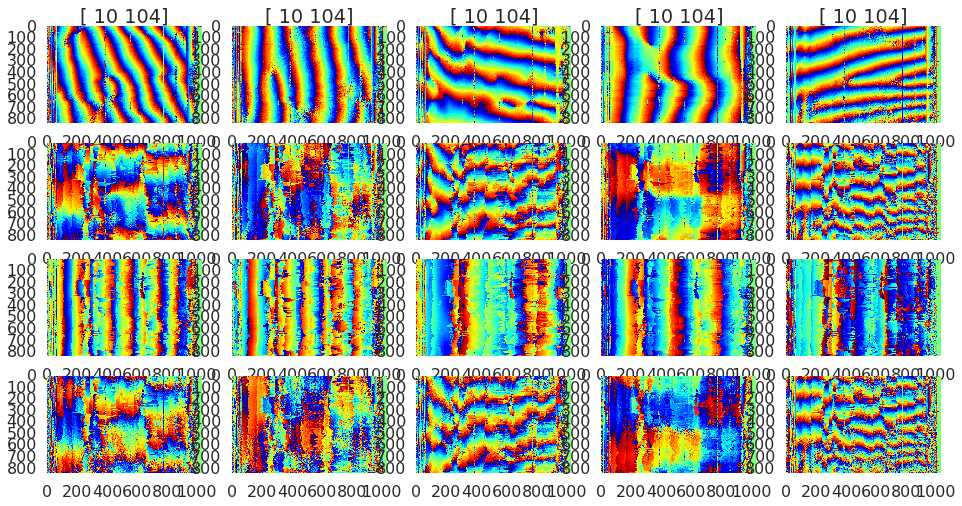

In [145]:
r = 4
c = 5

p.figure(figsize=(16,8))

l = 0
for i,j in plot_these:
    ax = p.subplot(r,c,l+1)
    p.title(str(bl))
    mdlkey = redmapping[i,j]
    capo.plot.waterfall(g['x'][i]*np.conj(g['x'][j])*v['xx'][mdlkey], cmap='jet', mode='phs')
    p.grid(0)
    ax = p.subplot(r,c,l+1+c)
    capo.plot.waterfall(v['xx'][mdlkey], cmap='jet', mode='phs')
    p.grid(0)
    ax = p.subplot(r,c,l+1+2*c)
    capo.plot.waterfall(g['x'][i]*np.conj(g['x'][j]), cmap='jet', mode='phs')
    p.grid(0)
    ax = p.subplot(r,c,l+1+3*c)
    print i,j
    if (i,j) in data.keys():
        capo.plot.waterfall(data[i,j]['xx'], cmap='jet', mode='phs')
    else:
        capo.plot.waterfall(data[j,i]['xx'], cmap='jet', mode='phs')
    p.grid(0)
    l+=1
        
cax = fig.add_axes([0.2, 0.06, 0.6, 0.01])
p.colorbar(cax=cax, orientation='horizontal')

In [126]:
data.keys()

[(72, 112),
 (20, 89),
 (9, 20),
 (53, 64),
 (97, 112),
 (80, 104),
 (22, 105),
 (96, 104),
 (9, 88),
 (31, 53),
 (43, 89),
 (31, 65)]

In [193]:
def load_dmv(filestring, day=2457458, offsets=False):
    '''load in the delays, means, and variances of firstcal solutions.'''
    data_dir = '/Users/sherlock/projects/hera/data/%d'%day
    files = glob.glob(data_dir+'/%s'%filestring)
    delays = {}
    means = {}
    medians = {}
    vars = {}
    if offsets:ss = 'o'
    else: ss = 'd'
    for f in files:
        print('Loading %s'%(f))
        d = np.load(f)
        for k in d.files:
            if k.startswith( ss ):
                if not k in delays.keys(): delays[k] = d[k].flatten()
                else: delays[k] = np.hstack((delays[k],d[k].flatten()))
    for k in delays.keys():
        means[k] = np.mean(delays[k])
        medians[k] = np.median(delays[k])
        vars[k] = np.var(delays[k])
    return delays, means, medians, vars

#load in solutions
delays, means, medians, vars = load_dmv('zen.2457458.[1-6]*.fc.npz',offsets=False)

Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.16694.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.17389.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.18085.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.18781.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.19477.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.20173.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.20869.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.21565.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.22261.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.22957.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.23653.xx.uvA.fc.npz
Loading /Users/sherlock/projects/hera/data/2457458/zen.2457458.24349.xx.uvA.fc.npz
Load